In [50]:
pip install pandas-profiling

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [52]:
pip install ipywidgets

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.8/137.8 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 18.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 384.3/384.3 kB 13.0 MB/s eta 0:00:00

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.7 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 9.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.5/64.5 kB 8.3 MB/s eta 0:00:00

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install hyperopt

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.5/200.5 kB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.9/840.9 kB 18.5 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for future: filename=future-0.18.3-py3-none-any.whl size=492024 sha256=870910194d5f9f2bdf760ccaaabdf55b38c2378e004de9a40d9d6f970284747d
  Stored in directory: /Users/Cow1998/Library/Caches/pip/wheels/a6/db/41/71a0e5d071a14e716cc11bb021a9caa8f76ec337eca071487e
Successfully built future

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [56]:
pip install -U seaborn

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 7.1 MB/s eta 0:00:0000:01
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.11.2
    Uninstalling seaborn-0.11.2:
      Successfully uninstalled seaborn-0.11.2

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold

from sklearn.linear_model import LinearRegression, SGDRegressor, RidgeCV
from sklearn.svm import SVR, LinearSVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor 
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, VotingRegressor 
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor
import sklearn.model_selection
from sklearn.model_selection import cross_val_predict as cvp
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import xgboost as xgb
import lightgbm as lgb

from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

In [3]:
valid_part = 0.3
pd.set_option('max_columns',50)

In [4]:
train0 = pd.read_csv('vehicles.csv')
train0.head(5)

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
0,7222695916,https://prescott.craigslist.org/cto/d/prescott...,prescott,https://prescott.craigslist.org,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az,NaN,NaN,NaN
1,7218891961,https://fayar.craigslist.org/ctd/d/bentonville...,fayetteville,https://fayar.craigslist.org,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar,NaN,NaN,NaN
2,7221797935,https://keys.craigslist.org/cto/d/summerland-k...,florida keys,https://keys.craigslist.org,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl,NaN,NaN,NaN
3,7222270760,https://worcester.craigslist.org/cto/d/west-br...,worcester / central MA,https://worcester.craigslist.org,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma,NaN,NaN,NaN
4,7210384030,https://greensboro.craigslist.org/cto/d/trinit...,greensboro,https://greensboro.craigslist.org,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,NaN


In [5]:
drop_columns = ['id','url', 'region', 'region_url', 'VIN', 'description', 'county','image_url', 'lat','long', 'posting_date']
train0 = train0.drop(columns = drop_columns)
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         426880 non-null  int64  
 1   year          425675 non-null  float64
 2   manufacturer  409234 non-null  object 
 3   model         421603 non-null  object 
 4   condition     252776 non-null  object 
 5   cylinders     249202 non-null  object 
 6   fuel          423867 non-null  object 
 7   odometer      422480 non-null  float64
 8   title_status  418638 non-null  object 
 9   transmission  424324 non-null  object 
 10  drive         296313 non-null  object 
 11  size          120519 non-null  object 
 12  type          334022 non-null  object 
 13  paint_color   296677 non-null  object 
 14  state         426880 non-null  object 
dtypes: float64(2), int64(1), object(12)
memory usage: 48.9+ MB


In [6]:
numerics = ['float16', 'float32', 'float64', 'int8', 'int16', 'int32', 'int64']
categorical_cols = []
features = train0.columns.values.tolist()
for col in features:
    if train0[col].dtype in numerics:
        continue
    categorical_cols.append(col)
for col in categorical_cols:
    if col in train0.columns:
        label_encoder = LabelEncoder()
        label_encoder.fit(list(train0[col].astype(str).values))
        train0[col] = label_encoder.transform(list(train0[col].astype(str).values))
train0.head(10)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
0,6000,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,3
1,11900,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,2
2,21000,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,9
3,1500,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,19
4,4900,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,27
5,1600,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,34
6,1000,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,34
7,15995,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,34
8,5000,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,37
9,3000,NaN,31,20664,4,7,4,NaN,3,2,2,3,6,6,38


In [7]:
# year range (1960, 2021)
train0.drop(train0[train0.year < 1960].index, inplace = True)
train0.drop(train0[train0.year > 2021].index, inplace = True)

# price range (100, 100,000)
train0.drop(train0[train0.price < 100].index, inplace = True)
train0.drop(train0[train0.price > 100000].index, inplace = True)

# delete missing vals
train0 = train0.dropna(axis = 0, subset = ['year', 'manufacturer', 'model', 'fuel', 'odometer', 'transmission'])

# imputate with mode
train0['title_status'].fillna(train0['title_status'].mode(), inplace = True)
train0['drive'].fillna(train0['drive'].mode(), inplace = True)
train0['size'].fillna(train0['size'].mode(), inplace = True)
train0['type'].fillna(train0['type'].mode(), inplace = True)
train0['paint_color'].fillna(train0['paint_color'].mode(), inplace = True)
train0['condition'].fillna(train0['condition'].mode(), inplace = True)
train0['cylinders'].fillna(train0['cylinders'].mode(), inplace = True)

train0['odometer'] = (train0['odometer']).astype(int)
train0.drop_duplicates(inplace = True, ignore_index = True)

In [8]:
train0.head(10)

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
0,33590,2014.0,14,24360,2,6,2,57923,0,3,2,3,9,11,1
1,22590,2010.0,7,24761,2,6,2,71229,0,3,2,3,9,1,1
2,39590,2020.0,7,24808,2,6,2,19160,0,3,2,3,9,9,1
3,30990,2017.0,40,27869,2,6,2,41124,0,3,2,3,9,9,1
4,15000,2013.0,13,14531,0,5,2,128000,0,0,3,1,11,0,1
5,27990,2012.0,14,24490,2,6,2,68696,0,3,0,3,9,0,1
6,34590,2016.0,7,24821,2,5,2,29499,0,3,0,3,9,10,1
7,35000,2019.0,40,26359,0,5,2,43000,0,0,0,3,11,5,1
8,29990,2016.0,7,11026,2,5,2,17302,0,3,0,3,9,9,1
9,38590,2011.0,7,11462,2,6,2,30237,0,3,3,3,8,9,1


Exploratory Data Analysis (EDA) using pandas profiling

In [9]:
train0['price'].value_counts()

4500     2466
3500     2390
5500     2282
6500     2272
6995     2208
         ... 
19903       1
30802       1
17854       1
10328       1
4098        1
Name: price, Length: 15180, dtype: int64

In [10]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 272669 entries, 0 to 272668
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         272669 non-null  int64  
 1   year          272669 non-null  float64
 2   manufacturer  272669 non-null  int64  
 3   model         272669 non-null  int64  
 4   condition     272669 non-null  int64  
 5   cylinders     272669 non-null  int64  
 6   fuel          272669 non-null  int64  
 7   odometer      272669 non-null  int64  
 8   title_status  272669 non-null  int64  
 9   transmission  272669 non-null  int64  
 10  drive         272669 non-null  int64  
 11  size          272669 non-null  int64  
 12  type          272669 non-null  int64  
 13  paint_color   272669 non-null  int64  
 14  state         272669 non-null  int64  
dtypes: float64(1), int64(14)
memory usage: 31.2 MB


In [11]:
train0.describe()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
count,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000,2.726690e+05,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000,272669.000000
mean,17529.437050,2010.542786,19.695367,16826.967404,2.260349,5.499184,2.071783,1.037290e+05,0.234508,0.457955,1.274622,2.426546,6.455461,6.108292,23.671415
std,14168.067498,8.806939,12.113844,7724.266996,1.587494,1.544081,0.922170,1.949398e+05,1.032302,1.010513,1.046670,0.948755,3.951090,3.872175,15.097210
min,100.000000,1960.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6700.000000,2007.000000,10.000000,11206.000000,0.000000,5.000000,2.000000,4.253500e+04,0.000000,0.000000,0.000000,2.000000,3.000000,3.000000,9.000000
50%,13900.000000,2013.000000,16.000000,17132.000000,2.000000,6.000000,2.000000,9.316500e+04,0.000000,0.000000,1.000000,3.000000,6.000000,6.000000,23.000000
75%,25000.000000,2016.000000,31.000000,23489.000000,4.000000,7.000000,2.000000,1.409980e+05,0.000000,0.000000,2.000000,3.000000,10.000000,10.000000,37.000000
max,100000.000000,2021.000000,42.000000,29667.000000,6.000000,8.000000,5.000000,1.000000e+07,6.000000,3.000000,3.000000,4.000000,13.000000,12.000000,50.000000


In [12]:
train0.corr()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
price,1.000000,0.398424,-0.050181,0.024576,0.126236,0.240670,-0.008885,-0.183315,-0.086737,0.257550,-0.062048,0.138738,0.057436,0.021891,0.008917
year,0.398424,1.000000,-0.010794,0.060289,0.107794,0.015568,0.133508,-0.178640,0.013283,0.186818,-0.164681,0.146582,0.033936,0.000501,0.009769
manufacturer,-0.050181,-0.010794,1.000000,-0.052268,-0.010853,-0.106566,-0.039566,0.013894,0.016048,0.002738,-0.077693,-0.000642,0.035163,0.008460,-0.016623
model,0.024576,0.060289,-0.052268,1.000000,0.003322,0.030529,0.060351,-0.009482,-0.010156,0.014819,-0.109160,0.020170,-0.099385,0.002537,0.006621
condition,0.126236,0.107794,-0.010853,0.003322,1.000000,0.248709,0.022535,-0.024669,-0.053682,-0.044187,0.041500,0.247718,0.006144,-0.003356,0.018953
cylinders,0.240670,0.015568,-0.106566,0.030529,0.248709,1.000000,0.087125,-0.019276,-0.094759,0.176057,0.163434,0.291233,0.019965,0.014001,0.016834
fuel,-0.008885,0.133508,-0.039566,0.060351,0.022535,0.087125,1.000000,-0.080950,-0.019690,0.306949,0.066132,0.116177,-0.046320,-0.042284,-0.020874
odometer,-0.183315,-0.178640,0.013894,-0.009482,-0.024669,-0.019276,-0.080950,1.000000,-0.002817,-0.116285,-0.001629,-0.053671,0.000735,0.006762,-0.000390
title_status,-0.086737,0.013283,0.016048,-0.010156,-0.053682,-0.094759,-0.019690,-0.002817,1.000000,-0.066300,-0.008334,-0.021410,-0.005061,-0.009931,-0.000459
transmission,0.257550,0.186818,0.002738,0.014819,-0.044187,0.176057,0.306949,-0.116285,-0.066300,1.000000,0.130141,0.209361,0.049448,-0.011218,-0.012278


In [13]:
pp.ProfileReport(train0)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Preparing data

In [14]:
target = 'price'
train_target0 = train0[target]
train0 = train0.drop([target], axis = 1)

In [15]:
train0, test0, train_target0, test_target0 = train_test_split(train0, train_target0, test_size = .2, random_state = 0)

In [16]:
# boosting
train0b = train0
train_target0b = train_target0
# Synthesis valid as test for selection models
trainb, testb, targetb, target_testb = train_test_split(train0b, train_target0b, test_size = valid_part, random_state = 0)

In [17]:
scaler = StandardScaler()
train0 = pd.DataFrame(scaler.fit_transform(train0), columns = train0.columns)

In [18]:
train0.head(5)

,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
0,-0.740441,1.015965,1.315400,1.096104,0.971393,-0.077144,0.642463,-0.225944,-0.452639,0.691459,0.603669,-0.116179,-0.026910,1.082616
1,0.620460,-0.304854,-0.109640,-0.163848,-1.619420,-0.077144,-0.099123,-0.225944,-0.452639,-0.263273,0.603669,-0.622675,1.264121,-0.308402
2,-0.513624,-0.800161,0.060195,1.096104,-0.324014,-0.077144,0.077360,-0.225944,-0.452639,-0.263273,0.603669,1.403307,1.005915,-1.103269
3,1.074094,1.263619,-1.809547,1.096104,0.971393,-2.249049,-0.527245,-0.225944,-0.452639,-1.218005,0.603669,0.643564,1.264121,-0.705835
4,-0.059990,0.603209,0.423149,0.466128,-1.619420,-0.077144,0.143885,-0.225944,-0.452639,-0.263273,-0.451664,0.896812,-0.285116,1.413811


In [19]:
len(train0)

218135

In [20]:
# test for selection models
train, test, target, target_test = train_test_split(train0, train_target0, test_size=valid_part, random_state=0)

In [21]:
train.head(5)

,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
113243,-1.420892,-0.469956,0.996554,-0.163848,0.323690,-2.249049,0.693445,-0.225944,-0.452639,1.646191,0.603669,1.150059,-0.026910,1.413811
8072,0.053418,0.273005,0.322774,-0.163848,-0.971717,-0.077144,0.070717,1.720091,-0.452639,1.646191,-2.562329,0.896812,-1.576148,-1.500702
18357,0.166827,1.015965,0.817406,-0.163848,-1.619420,-0.077144,0.158140,-0.225944,-0.452639,-1.218005,-1.506997,-0.116179,-1.317941,0.685182
37261,0.393644,1.676375,1.430262,-0.163848,0.971393,3.180712,-0.452404,-0.225944,2.519348,0.691459,0.603669,0.643564,1.005915,-1.103269
46151,-0.173399,-0.552507,-0.285555,1.096104,0.971393,-0.077144,-0.139454,-0.225944,-0.452639,-1.218005,0.603669,0.643564,1.264121,0.950138


In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152694 entries, 113243 to 199340
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          152694 non-null  float64
 1   manufacturer  152694 non-null  float64
 2   model         152694 non-null  float64
 3   condition     152694 non-null  float64
 4   cylinders     152694 non-null  float64
 5   fuel          152694 non-null  float64
 6   odometer      152694 non-null  float64
 7   title_status  152694 non-null  float64
 8   transmission  152694 non-null  float64
 9   drive         152694 non-null  float64
 10  size          152694 non-null  float64
 11  type          152694 non-null  float64
 12  paint_color   152694 non-null  float64
 13  state         152694 non-null  float64
dtypes: float64(14)
memory usage: 17.5 MB


In [23]:
test.head(5)

,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
198073,0.280235,-0.222303,1.119436,1.096104,0.971393,-0.077144,-0.083013,-0.225944,-0.452639,0.691459,-1.506997,0.896812,1.264121,1.546289
157754,0.280235,0.933414,0.179585,1.096104,0.971393,-2.249049,0.000097,-0.225944,0.538023,0.691459,0.603669,-0.116179,-0.026910,-1.301986
134357,0.166827,-1.295468,-1.827397,-1.423801,-1.619420,-0.077144,-0.152847,-0.225944,-0.452639,1.646191,-0.451664,0.896812,1.264121,-0.970791
118244,-0.627033,-0.304854,-0.467290,-1.423801,-1.619420,-0.077144,0.143345,4.639143,-0.452639,-1.218005,0.603669,-1.635665,-1.576148,1.281333
22585,0.733869,-0.304854,-1.129170,-0.163848,0.971393,-0.077144,-0.359582,-0.225944,2.519348,-0.263273,0.603669,0.896812,1.264121,-0.109685


In [24]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65441 entries, 198073 to 146786
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          65441 non-null  float64
 1   manufacturer  65441 non-null  float64
 2   model         65441 non-null  float64
 3   condition     65441 non-null  float64
 4   cylinders     65441 non-null  float64
 5   fuel          65441 non-null  float64
 6   odometer      65441 non-null  float64
 7   title_status  65441 non-null  float64
 8   transmission  65441 non-null  float64
 9   drive         65441 non-null  float64
 10  size          65441 non-null  float64
 11  type          65441 non-null  float64
 12  paint_color   65441 non-null  float64
 13  state         65441 non-null  float64
dtypes: float64(14)
memory usage: 7.5 MB


In [25]:
acc_train_r2 = []
acc_test_r2 = []
acc_train_d = []
acc_test_d = []
acc_train_rmse = []
acc_test_rmse = []

In [26]:
def acc_d(y_meas, y_pred):
    # Relative error b/w predicted y_pred & measured y_meas 
    return mean_absolute_error(y_meas, y_pred) * len(y_meas) / sum(abs(y_meas))

def acc_rmse(y_meas, y_pred):
    # RMSE between predicted & meas vals
    return (mean_squared_error(y_meas, y_pred)) ** .5

In [27]:
def acc_model(num, model, train, test):
    # Accuracy of models using different metrics
    global acc_train_r2, acc_test_r2, acc_train_d, acc_test_d, acc_train_rmse, acc_test_rmse

    ytrain = model.predict(train)
    ytest = model.predict(test)

    print('target = ', target[:5].values)
    print('ytrain = ', ytrain[:5])

    acc_train_r2_num = round(r2_score(target, ytrain) * 100, 2)
    print('acc(r2_score) for training = ', acc_train_r2_num)
    acc_train_r2.insert(num, acc_train_r2_num)

    acc_train_d_num = round(acc_d(target, ytrain) * 100, 2)
    print('acc(relative error) for training =', acc_train_d_num)
    acc_train_d.insert(num, acc_train_d_num)

    acc_train_rmse_num = round(acc_rmse(target, ytrain) * 100, 2)
    print('acc(rmse) for training =', acc_train_rmse_num)
    acc_train_rmse.insert(num, acc_train_rmse_num)

    print('target_test =', target_test[:5].values)
    print('ytest =', ytest[:5])

    acc_test_r2_num = round(r2_score(target_test, ytest) * 100, 2)
    print('acc(r2_score) for test =', acc_test_r2_num)
    acc_test_r2.insert(num, acc_test_r2_num)
    
    acc_test_d_num = round(acc_d(target_test, ytest) * 100, 2)
    print('acc(relative error) for test =', acc_test_d_num)
    acc_test_d.insert(num, acc_test_d_num)
    
    acc_test_rmse_num = round(acc_rmse(target_test, ytest) * 100, 2)
    print('acc(rmse) for test =', acc_test_rmse_num)
    acc_test_rmse.insert(num, acc_test_rmse_num)


In [28]:
def acc_boosting_model(num,model,train,test,num_iteration=0):
    # Calculation of accuracy of boosting model by different metrics
    
    global acc_train_r2, acc_test_r2, acc_train_d, acc_test_d, acc_train_rmse, acc_test_rmse
    
    if num_iteration > 0:
        ytrain = model.predict(train, num_iteration = num_iteration)  
        ytest = model.predict(test, num_iteration = num_iteration)
    else:
        ytrain = model.predict(train)  
        ytest = model.predict(test)

    print('target = ', targetb[:5].values)
    print('ytrain = ', ytrain[:5])

    acc_train_r2_num = round(r2_score(targetb, ytrain) * 100, 2)
    print('acc(r2_score) for train =', acc_train_r2_num)   
    acc_train_r2.insert(num, acc_train_r2_num)

    acc_train_d_num = round(acc_d(targetb, ytrain) * 100, 2)
    print('acc(relative error) for train =', acc_train_d_num)   
    acc_train_d.insert(num, acc_train_d_num)

    acc_train_rmse_num = round(acc_rmse(targetb, ytrain) * 100, 2)
    print('acc(rmse) for train =', acc_train_rmse_num)   
    acc_train_rmse.insert(num, acc_train_rmse_num)

    print('target_test =', target_testb[:5].values)
    print('ytest =', ytest[:5])
    
    acc_test_r2_num = round(r2_score(target_testb, ytest) * 100, 2)
    print('acc(r2_score) for test =', acc_test_r2_num)
    acc_test_r2.insert(num, acc_test_r2_num)
    
    acc_test_d_num = round(acc_d(target_testb, ytest) * 100, 2)
    print('acc(relative error) for test =', acc_test_d_num)
    acc_test_d.insert(num, acc_test_d_num)
    
    acc_test_rmse_num = round(acc_rmse(target_testb, ytest) * 100, 2)
    print('acc(rmse) for test =', acc_test_rmse_num)
    acc_test_rmse.insert(num, acc_test_rmse_num)

Tuning models & test for all features


Linear Regression

In [29]:
lin_reg = LinearRegression()
lin_reg.fit(train, target)
acc_model(0, lin_reg, train, test)

target =  [ 4500  2000  5300 34590 16995]
ytrain =  [12755.84114809 11135.34121381 12768.76329074 22788.57912379
 21252.07319456]
acc(r2_score) for training =  27.47
acc(relative error) for training = 49.98
acc(rmse) for training = 1207099.72
target_test = [10999 26000 14000  5998 21990]
ytest = [21877.13662303 27317.90347245 12192.27381459  3753.24029966
 32600.42217688]
acc(r2_score) for test = 27.21
acc(relative error) for test = 50.0
acc(rmse) for test = 1205704.62


Linear SVR

In [30]:
linear_svr = LinearSVR()
linear_svr.fit(train, target)
acc_model(2, linear_svr, train, test)

target =  [ 4500  2000  5300 34590 16995]
ytrain =  [ 4356.54330636  8565.92368549  9350.78326543 22996.93754127
 15449.18679075]
acc(r2_score) for training =  9.93
acc(relative error) for training = 46.58
acc(rmse) for training = 1345224.35
target_test = [10999 26000 14000  5998 21990]
ytest = [16298.06596864 20791.51030949 10662.93564596  2872.05440085
 28618.86997548]
acc(r2_score) for test = 8.35
acc(relative error) for test = 46.61
acc(rmse) for test = 1352945.43


Support Vector Machines (SVM)

In [31]:
svr = SVR()
svr.fit(train, target)
acc_model(1, svr, train, test)

MLP Regressor

In [ ]:
mlp = MLPRegressor()
param_grid = {'hidden_layer_sizes': [i for i in range(2,20)],
              'activation': ['relu'],
              'solver': ['adam'],
              'learning_rate': ['constant'],
              'learning_rate_init': [0.01],
              'power_t': [0.5],
              'alpha': [0.0001],
              'max_iter': [1000],
              'early_stopping': [True],
              'warm_start': [False]}
mlp_GS = GridSearchCV(mlp, param_grid=param_grid, 
                   cv=10, verbose=True, pre_dispatch='2*n_jobs')
mlp_GS.fit(train, target)
acc_model(3,mlp_GS,train,test)

Fitting 10 folds for each of 18 candidates, totalling 180 fits
target =  [14995 47900 11500 32500  1750]
ytrain =  [19187.64436455 45040.24649486 11050.66673918 13025.60622253
  6280.14893889]
acc(r2_score) for training =  67.14
acc(relative error) for training = 28.57
acc(rmse) for training = 824876.16
target_test = [24995  5995 14990 36900  6900]
ytest = [21893.15946197 12077.1169314   8790.23299033 37186.1056786
  8808.29490538]
acc(r2_score) for test = 67.61
acc(relative error) for test = 28.39
acc(rmse) for test = 820753.32


Stochastic Gradient Descent

In [ ]:
sgd = SGDRegressor()
sgd.fit(train, target)
acc_model(4, sgd, train, test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [20012.45141909 29127.49431597 17444.38494426 20662.16429938
 14124.3256369 ]
acc(r2_score) for training =  28.36
acc(relative error) for training = 47.87
acc(rmse) for training = 1217997.75
target_test = [24995  5995 14990 36900  6900]
ytest = [19237.98407739 22775.76871775 24734.73224954 20556.84865343
  6874.26070502]
acc(r2_score) for test = 28.84
acc(relative error) for test = 47.76
acc(rmse) for test = 1216461.63


Decision Tree Regressor

In [ ]:
decision_tree = DecisionTreeRegressor()
decision_tree.fit(train, target)
acc_model(5,decision_tree,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [14995. 47900. 11500. 32500.  1675.]
acc(r2_score) for training =  99.95
acc(relative error) for training = 0.1
acc(rmse) for training = 31904.89
target_test = [24995  5995 14990 36900  6900]
ytest = [24995.  5995. 14990. 59286.  9000.]
acc(r2_score) for test = 77.01
acc(relative error) for test = 15.26
acc(rmse) for test = 691403.52


Random Forest

In [ ]:
random_forest = RandomForestRegressor()
random_forest.fit(train, target)
# print(get_params(random_forest))
acc_model(6,random_forest,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [15360.48       47335.11888889 11724.5        27341.29
  1842.775     ]
acc(r2_score) for training =  98.26
acc(relative error) for training = 4.65
acc(rmse) for training = 189998.59
target_test = [24995  5995 14990 36900  6900]
ytest = [25607.02 12023.42 14909.65 52516.27  8284.23]
acc(r2_score) for test = 88.06
acc(relative error) for test = 12.27
acc(rmse) for test = 498276.16


XGB

In [ ]:
xgb_clf = xgb.XGBRegressor(objective='reg:squarederror')  # {'objective': 'reg:squarederror'}
parameters = {'n_estimators': [60, 100, 120, 140], 
              'learning_rate': [0.01, 0.1],
              'max_depth': [5, 7],
              'reg_lambda': [0.5]}
xgb_reg = GridSearchCV(estimator=xgb_clf, param_grid=parameters, cv=5, n_jobs=-1).fit(trainb, targetb)
print("Best score: %0.3f" % xgb_reg.best_score_)
print("Best parameters set:", xgb_reg.best_params_)
acc_boosting_model(7,xgb_reg,trainb,testb)

Best score: 0.828
Best parameters set: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 140, 'reg_lambda': 0.5}
target =  [14995 47900 11500 32500  1750]
ytrain =  [15374.749 51056.48  11966.418 19825.652  2853.787]
acc(r2_score) for train = 84.89
acc(relative error) for train = 18.04
acc(rmse) for train = 559385.2
target_test = [24995  5995 14990 36900  6900]
ytest = [27438.225 14180.932 11321.013 47157.13   7673.058]
acc(r2_score) for test = 83.23
acc(relative error) for test = 18.73
acc(rmse) for test = 590597.46


Light GBM

In [ ]:
Xtrain, Xval, Ztrain, Zval = train_test_split(trainb, targetb, test_size=0.2, random_state=0)
train_set = lgb.Dataset(Xtrain, Ztrain, silent=False)
valid_set = lgb.Dataset(Xval, Zval, silent=False)

In [ ]:
params = {
        'boosting_type':'gbdt',
        'objective': 'regression',
        'num_leaves': 31,
        'learning_rate': 0.01,
        'max_depth': -1,
        'subsample': 0.8,
        'bagging_fraction' : 1,
        'max_bin' : 5000 ,
        'bagging_freq': 20,
        'colsample_bytree': 0.6,
        'metric': 'rmse',
        'min_split_gain': 0.5,
        'min_child_weight': 1,
        'min_child_samples': 10,
        'scale_pos_weight':1,
        'zero_as_missing': False,
        'seed':0,        
    }
modelL = lgb.train(params, train_set = train_set, num_boost_round=10000,
                   early_stopping_rounds=8000,verbose_eval=500, valid_sets=valid_set)

[LightGBM] [Warning] bagging_fraction is set=1, subsample=0.8 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] bagging_fraction is set=1, subsample=0.8 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9978
[LightGBM] [Info] Number of data points in the train set: 172137, number of used features: 14
[LightGBM] [Warning] bagging_fraction is set=1, subsample=0.8 will be ignored. Current value: bagging_fraction=1
[LightGBM] [Info] Start training from score 18794.093280
Training until validation scores don't improve for 8000 rounds
[500]	valid_0's rmse: 7304.01
[1000]	valid_0's rmse: 6742.9
[1500]	valid_0's rmse: 6469.04
[2000]	valid_0's rmse: 6279.22
[2500]	valid_0's rmse: 6136.12
[3000]	valid_0's rmse: 6020.85


In [ ]:
acc_boosting_model(8,modelL,trainb,testb,modelL.best_iteration)

target =  [14995 47900 11500 32500  1750]
ytrain =  [13656.05845062 50538.07104722 11055.71036117 18365.5739292
  2390.22950121]
acc(r2_score) for train = 89.63
acc(relative error) for train = 14.66
acc(rmse) for train = 463434.9
target_test = [24995  5995 14990 36900  6900]
ytest = [26734.13237912 13186.73338038 11485.16846963 46704.78227195
  6892.88514201]
acc(r2_score) for test = 87.23
acc(relative error) for test = 15.75
acc(rmse) for test = 515252.4


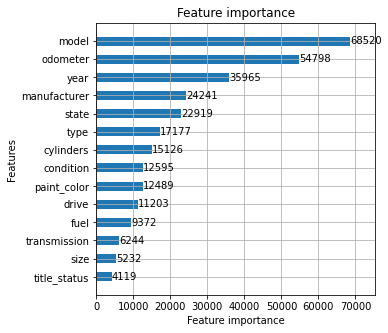

In [ ]:
fig =  plt.figure(figsize = (5,5))
axes = fig.add_subplot(111)
lgb.plot_importance(modelL,ax = axes,height = 0.5)
plt.show();
plt.close()

Ridge Regression

In [ ]:
ridge = RidgeCV(cv = 5)
ridge.fit(train, target)
acc_model(10,ridge,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [19160.6089971  29427.98996055 16467.98247551 19955.10808726
 14533.13267113]
acc(r2_score) for training =  28.83
acc(relative error) for training = 47.34
acc(rmse) for training = 1213935.09
target_test = [24995  5995 14990 36900  6900]
ytest = [19065.8987924  22162.09649665 24755.40891055 20958.35642968
  6920.84606344]
acc(r2_score) for test = 29.46
acc(relative error) for test = 47.22
acc(rmse) for test = 1211198.84


Bagging Regressor

In [ ]:
bagging = BaggingRegressor()
bagging.fit(train, target)
acc_model(11,bagging,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [15995.   47904.3  12206.9  26246.5   2603.75]
acc(r2_score) for training =  97.52
acc(relative error) for training = 5.36
acc(rmse) for training = 226730.47
target_test = [24995  5995 14990 36900  6900]
ytest = [24280.7 15826.2 14990.  47447.6  8382. ]
acc(r2_score) for test = 86.66
acc(relative error) for test = 13.26
acc(rmse) for test = 526702.52


Extra Trees Regressor

In [ ]:
etr = ExtraTreesRegressor()
etr.fit(train, target)
acc_model(12,etr,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [14995. 47900. 11500. 32500.  1675.]
acc(r2_score) for training =  99.95
acc(relative error) for training = 0.1
acc(rmse) for training = 31906.05
target_test = [24995  5995 14990 36900  6900]
ytest = [24995.         11125.85       14990.         45381.39333333
  7358.48      ]
acc(r2_score) for test = 88.71
acc(relative error) for test = 11.0
acc(rmse) for test = 484628.54


Voting Regressor

In [ ]:
# Voting_Reg = VotingRegressor(estimators=[('lin', lin_reg), ('ridge', ridge), ('sgd', sgd)])
Voting_Reg = VotingRegressor(estimators=[('etr', etr), ('random_forest', random_forest)])
Voting_Reg.fit(train, target)
acc_model(14,Voting_Reg,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [15306.675  47723.01   11635.685  29862.06    1793.3325]
acc(r2_score) for training =  99.53
acc(relative error) for training = 2.38
acc(rmse) for training = 99014.03
target_test = [24995  5995 14990 36900  6900]
ytest = [25694.74   12009.83   14947.545  48196.85    7885.3475]
acc(r2_score) for test = 89.06
acc(relative error) for test = 11.32
acc(rmse) for test = 477023.76


In [ ]:
def compute_feature_importance(voting_clf, weights):
    feat_importance = dict()
    for est in voting_clf.estimators_:
        feat_importance[str(est)] = est.feature_importances_
    
    feat_scores = [0]*len(list(feat_importance.values())[0])
    for index, imp_score in enumerate(feat_importance.values()):
        imp_score_with_weight = imp_score * weights[index]
        feat_scores = list(np.add(feat_scores, list(imp_score_with_weight)))
    return feat_scores

In [ ]:
voting_df = pd.DataFrame()
voting_df['Feature'] = train.columns
voting_df['Feature Importance'] = compute_feature_importance(Voting_Reg, [1, 1])
voting_df.sort_values('Feature Importance', ascending=False)

,Feature,Feature Importance
0,year,0.726310
6,odometer,0.207240
5,fuel,0.197063
4,cylinders,0.154382
2,model,0.144516
9,drive,0.133252
1,manufacturer,0.093159
8,transmission,0.082435
11,type,0.069439
13,state,0.052800


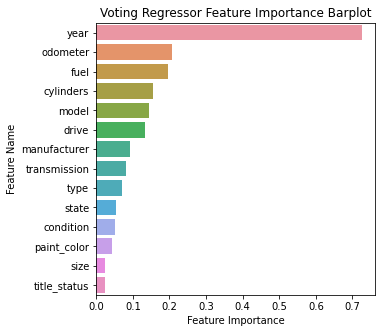

In [ ]:
fig =  plt.figure(figsize = (5,5))
#Plot Searborn bar chart
sns.barplot(x = 'Feature Importance', y = 'Feature', data = voting_df, order = voting_df.sort_values('Feature Importance', ascending=False)['Feature'])
#Add chart labels
plt.title('Voting Regressor Feature Importance Barplot')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.show();
plt.close()


Ada Boost

In [ ]:
Ada_Boost = AdaBoostRegressor()
Ada_Boost.fit(train, target)
acc_model(13,Ada_Boost,train,test)

target =  [14995 47900 11500 32500  1750]
ytrain =  [17117.04887152 42913.10713838 17117.04887152 29584.89724831
 10292.51117528]
acc(r2_score) for training =  43.9
acc(relative error) for training = 43.8
acc(rmse) for training = 1077838.56
target_test = [24995  5995 14990 36900  6900]
ytest = [29584.89724831 17117.04887152 17897.58114354 29066.60342581
 17622.44643122]
acc(r2_score) for test = 44.4
acc(relative error) for test = 43.73
acc(rmse) for test = 1075313.03


Model Comparison

In [ ]:
models = pd.DataFrame({
    'Model': ['LinearRegression', 'LinearSVR', 'SVR', 
              'MLPRegressor', 'SGDRegressor', 
              'DecisionTreeRegressor', 'RandomForestRegressor', 'XGBRegressor', 'LGBM',
              'RidgeRegressor', 'BaggingRegressor', 'ExtraTreesRegressor', 
              'VotingRegressor', 'AdaBoostRegressor'],
    
    'r2_train': acc_train_r2,
    'r2_test': acc_test_r2,
    'd_train': acc_train_d,
    'd_test': acc_test_d,
    'rmse_train': acc_train_rmse,
    'rmse_test': acc_test_rmse
                     })

In [ ]:
models.to_csv('tables.csv', index = False)

In [ ]:
pd.options.display.float_format = '{:,.2f}'.format

In [ ]:
print('Prediction accuracy for models by R2 criterion - r2_test')
models.sort_values(by=['r2_test', 'r2_train'], ascending=False)

Prediction accuracy for models by R2 criterion - r2_test


,Model,r2_train,r2_test,d_train,d_test,rmse_train,rmse_test
12,VotingRegressor,99.53,89.05,2.38,11.32,"99,122.26","477,102.04"
11,ExtraTreesRegressor,99.95,88.64,0.10,11.00,"31,906.03","486,110.48"
6,RandomForestRegressor,98.25,88.06,4.65,12.26,"190,284.72","498,388.17"
8,LGBM,89.63,87.23,14.66,15.75,"463,434.90","515,252.40"
10,BaggingRegressor,97.50,86.67,5.37,13.23,"227,531.48","526,536.49"
7,XGBRegressor,84.89,83.23,18.04,18.73,"559,385.20","590,597.46"
5,DecisionTreeRegressor,99.95,77.10,0.10,15.25,"31,904.89","690,106.74"
3,MLPRegressor,65.65,65.91,29.54,29.49,"843,329.12","842,036.17"
13,AdaBoostRegressor,43.90,44.40,43.80,43.73,"1,077,838.56","1,075,313.03"
0,LinearRegression,28.83,29.46,47.34,47.22,"1,213,935.09","1,211,198.61"


In [ ]:
print('Prediction accuracy for models by relative error - d_test')
models.sort_values(by=['d_test', 'd_train'], ascending=True)

Prediction accuracy for models by relative error - d_test


,Model,r2_train,r2_test,d_train,d_test,rmse_train,rmse_test
11,ExtraTreesRegressor,99.95,88.64,0.10,11.00,"31,906.03","486,110.48"
12,VotingRegressor,99.53,89.05,2.38,11.32,"99,122.26","477,102.04"
6,RandomForestRegressor,98.25,88.06,4.65,12.26,"190,284.72","498,388.17"
10,BaggingRegressor,97.50,86.67,5.37,13.23,"227,531.48","526,536.49"
5,DecisionTreeRegressor,99.95,77.10,0.10,15.25,"31,904.89","690,106.74"
8,LGBM,89.63,87.23,14.66,15.75,"463,434.90","515,252.40"
7,XGBRegressor,84.89,83.23,18.04,18.73,"559,385.20","590,597.46"
3,MLPRegressor,65.65,65.91,29.54,29.49,"843,329.12","842,036.17"
13,AdaBoostRegressor,43.90,44.40,43.80,43.73,"1,077,838.56","1,075,313.03"
2,SVR,10.52,14.21,44.35,44.11,"1,361,232.90","1,335,716.13"


In [ ]:
print('Prediction accuracy for models by RMSE - rmse_test')
models.sort_values(by=['rmse_test', 'rmse_train'], ascending=True)

Prediction accuracy for models by RMSE - rmse_test


,Model,r2_train,r2_test,d_train,d_test,rmse_train,rmse_test
12,VotingRegressor,99.53,89.05,2.38,11.32,"99,122.26","477,102.04"
11,ExtraTreesRegressor,99.95,88.64,0.10,11.00,"31,906.03","486,110.48"
6,RandomForestRegressor,98.25,88.06,4.65,12.26,"190,284.72","498,388.17"
8,LGBM,89.63,87.23,14.66,15.75,"463,434.90","515,252.40"
10,BaggingRegressor,97.50,86.67,5.37,13.23,"227,531.48","526,536.49"
7,XGBRegressor,84.89,83.23,18.04,18.73,"559,385.20","590,597.46"
5,DecisionTreeRegressor,99.95,77.10,0.10,15.25,"31,904.89","690,106.74"
3,MLPRegressor,65.65,65.91,29.54,29.49,"843,329.12","842,036.17"
13,AdaBoostRegressor,43.90,44.40,43.80,43.73,"1,077,838.56","1,075,313.03"
0,LinearRegression,28.83,29.46,47.34,47.22,"1,213,935.09","1,211,198.61"


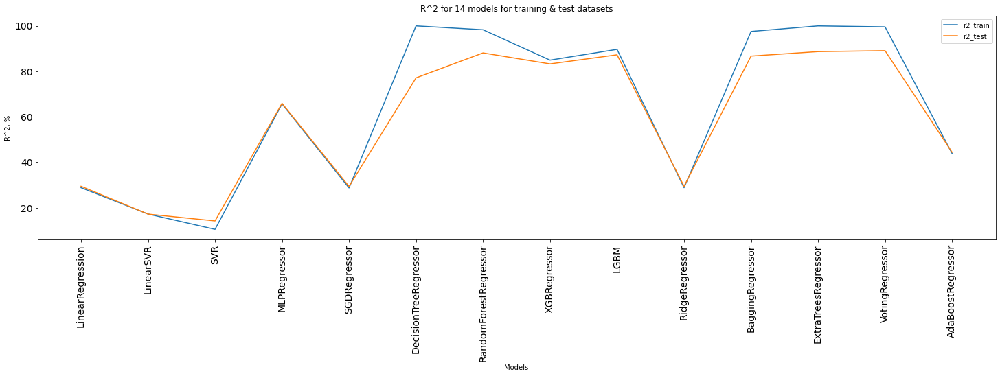

In [ ]:
# Plot
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['r2_train'], label = 'r2_train')
plt.plot(xx, models['r2_test'], label = 'r2_test')
plt.legend()
plt.title('R^2 for 14 models for training & test datasets')
plt.xlabel('Models')
plt.ylabel('R^2, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()

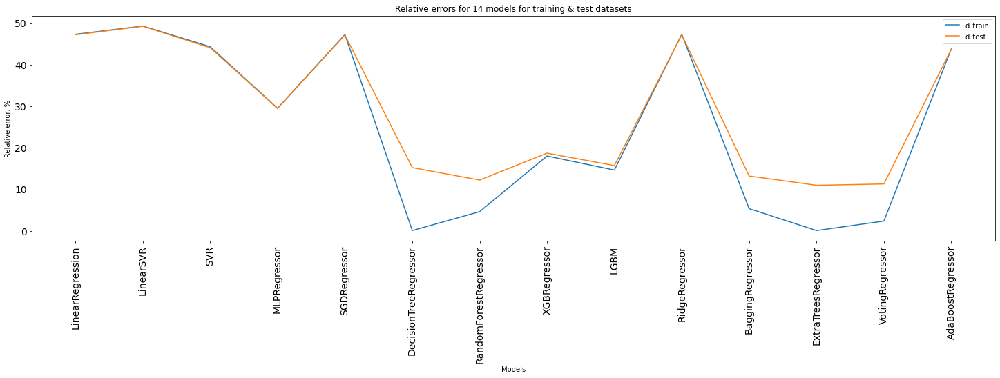

In [ ]:
# Plot
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['d_train'], label = 'd_train')
plt.plot(xx, models['d_test'], label = 'd_test')
plt.legend()
plt.title('Relative errors for 14 models for training & test datasets')
plt.xlabel('Models')
plt.ylabel('Relative error, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()

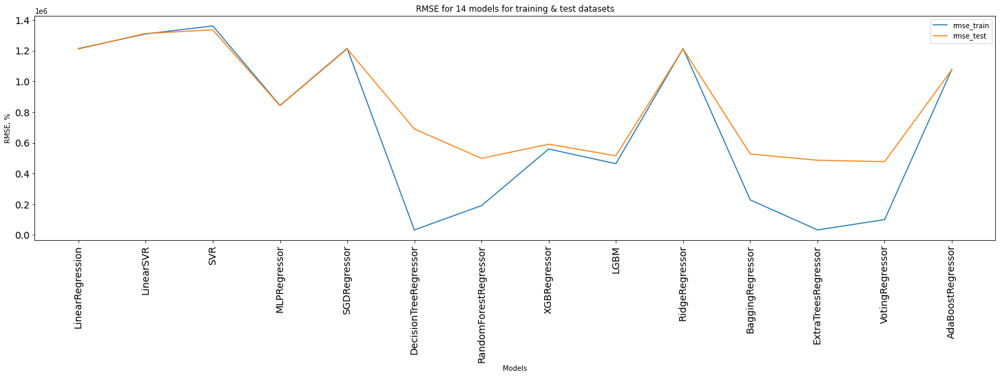

In [ ]:
# Plot
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['rmse_train'], label = 'rmse_train')
plt.plot(xx, models['rmse_test'], label = 'rmse_test')
plt.legend()
plt.title('RMSE for 14 models for training & test datasets')
plt.xlabel('Models')
plt.ylabel('RMSE, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()

Prediction

In [ ]:
test0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76848 entries, 321002 to 271055
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          76848 non-null  float64
 1   manufacturer  76848 non-null  int64  
 2   model         76848 non-null  int64  
 3   condition     76848 non-null  int64  
 4   cylinders     76848 non-null  int64  
 5   fuel          76848 non-null  int64  
 6   odometer      76848 non-null  int64  
 7   title_status  76848 non-null  int64  
 8   transmission  76848 non-null  int64  
 9   drive         76848 non-null  int64  
 10  size          76848 non-null  int64  
 11  type          76848 non-null  int64  
 12  paint_color   76848 non-null  int64  
 13  state         76848 non-null  int64  
dtypes: float64(1), int64(13)
memory usage: 8.8 MB


In [ ]:
test0.head(3)

,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,drive,size,type,paint_color,state
321002,"2,006.00",4,28932,4,7,2,146103,0,0,2,3,0,0,37
170559,"2,018.00",3,7663,2,7,2,13035,0,3,1,3,10,6,17
211245,"2,018.00",13,13017,4,3,2,46275,0,0,0,3,0,5,23


In [ ]:
testn = pd.DataFrame(scaler.transform(test0), columns = test0.columns)

In [ ]:
lin_reg.fit(train0, train_target0)
lin_reg.predict(testn)[:3]

array([15887.78217742, 34436.85011676, 18968.47754935])

In [ ]:
ridge.fit(train0, train_target0)
ridge.predict(testn)[:3]

array([15887.89428218, 34436.3911515 , 18968.5199704 ])